# Use case Moving Averages for Deep Folding projects
This use case is focused on an example of use of moving averages in deep_folding projects. <br>
Here, we suppose test skeletons have been encoded to a latent space of much fewer dimensions. <br>
We consider two cases:
- one cluster and the analysis of moving averages along one axis of this cluster,
- two cluster and the analysis of average crops of each cluster.

### 1) Imports

In [1]:
import moving_averages as ma
import colorado as cld
from tqdm import tqdm

import os
import glob
import sys
import pandas as pd
import numpy as np
from scipy.spatial import distance

import plotly.graph_objects as go
import pickle
import matplotlib.pyplot as plt

import deep_folding.anatomist_tools.utils.remove_hull as rhull

from soma import aims

In [2]:
location = 'ns' # 'home' or 'ns'
root = '/home/lg261972/ns_remote' if location == 'home' else '/nfs/neurospin' 
path = os.path.join(root, 'dico/data/deep_folding/data/crops/SC/sulcus_based/2mm/')
#path = os.path.join(root, 'dico/data/deep_folding/data/crops/STS_branches/sulcus_based/2mm/Rcrops/')

### 2) Loading of subjects's distribution in the latent space
DataFrame is obtained during analysis of beta-VAE latent space (125 dimensions) for SC crops, according to the following steps:
- loading of trained model
- encoding of test controls and asymmetry benchmark subjects
- projection of the subjects in a 2D space with tSNE algorithm
- export of points' coordinates

In [3]:
df_subjects = pd.read_csv('../data/visualization/sub_sort_asym_bench_sc_label.csv', index_col="id_sub").drop(columns={'Unnamed: 0'})
df_subjects.index.astype(int)
subjects = df_subjects.index
df_subjects = df_subjects.rename(columns={'91': 0, '17': 1})
assert(type(list(df_subjects.index)[0])==int)
df_subjects.head()

,0,1,label
id_sub,,,
519950,-0.287488,-0.908174,normal_test
103515,-1.600874,-0.619523,normal_test
107018,-0.873523,-3.006382,normal_test
766563,0.928389,-1.768081,normal_test
175540,-0.832408,-0.000899,normal_test


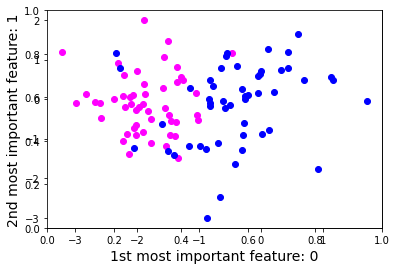

In [4]:
color_dict = {'normal_test': 'blue', 'benchmark': 'magenta'}

arr = np.array([np.array([df_subjects[k][i] for k in df_subjects.columns[:2]]) for i in df_subjects.index])

fig, ax = plt.subplots()
ax = fig.add_subplot(111)
for g in np.unique([df_subjects.label]):
    ix = np.where(df_subjects.label == g)
    x = [arr[ix][k][0] for k in range(len(ix[0]))]
    y = [arr[ix][k][1] for k in range(len(ix[0]))]
    if g =='benchmark':
        g_lab = 'benchmark asymmetry'
    else:
        g_lab=g
    ax.scatter(x, y, c = color_dict[g], label = g_lab)

plt.xlabel(f'1st most important feature: {df_subjects.columns[0]}', fontsize=14)
plt.ylabel(f'2nd most important feature: {df_subjects.columns[1]}', fontsize=14)
plt.show()

### 3) Construction of dictionnary of subjects' buckets

In [5]:
tgt_dir = '/tmp/test/'
dataset = rhull.DatasetHullRemoved(src_dir=path,
                                   tgt_dir=tgt_dir,
                                   side='R',
                                   list_subjects=list(subjects))
buckets = dataset.create_meshes()

SUBMITTING | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING | :   0%|          | 0/100 [00:00<?, ?it/s]

In [6]:
def centeroidnp(df):
    """Gives centroid of a dataframe of points.
    /!\ Centroid is not a point within the defined set of points
    
    Args:
        IN: df: pandas.DataFrame with index corresponding to subjects and as many columns as coordinates
        OUT: coords: tuple of coordinates of centroid
    """
    coords = []
    ndim = len(df.columns) # number of dimensions to consider
    
    for k in range(len(df.columns)):
        arr = np.array(list(df[df.columns[k]]))
        length = arr.shape[0]
        sum_k = np.sum(arr)
        coords.append(sum_k/length)

    return tuple(coords)

In [7]:
def closest_distance(centroid, df):
    """Returns closest point to centroid of a given cluster
    /!\ central_point is part of the defined set of points
    
    Args:
        IN: centroid: tuple of coordinates of centroid
            df: pandas.DataFrame with index corresponding to subjects and as many columns as coordinates
        OUT: central_point: subject ID corresponding to closest point to the centroid
    """
    # df must have as many columns as dimensions to consider
    distances = {}
    # Get distances to centroid for each point
    for sub in list(df.index):
        pos = [df.loc[sub][k] for k in range(len(df.columns))]
        distances[sub] = distance.euclidean(pos, centroid)
        
    # Get closest point to centroid
    central_point = min(distances, key=distances.get)
    return central_point

### 4) One cluster analysis

#### Get central subject

In [8]:
centroid = centeroidnp(df_subjects[[0, 1]])
print(f"Coordinates of centroid are: {centroid}")
central = closest_distance(centroid, df_subjects[[0, 1]])
print(f"Closest subject to centroid is {central}")

Coordinates of centroid are: (-1.128909128382802, -0.11155132960528136)
Closest subject to centroid is 194847


#### Alignment of all subjects to central subject

In [10]:
aligned_buckets, aligned_rot, aligned_transl = ma.align_buckets_by_ICP_batch(buckets, central, cores=2)

2


Aligning buckets to 194847: 100%|██████████| 100/100 [03:11<00:00,  1.92s/it]


In [13]:
#fig = cld.draw_numpy_buckets(list(aligned_buckets.values()), shift=(0,50,0))
#ma.plot.brochette_layout(fig)

#### Subjects histogram

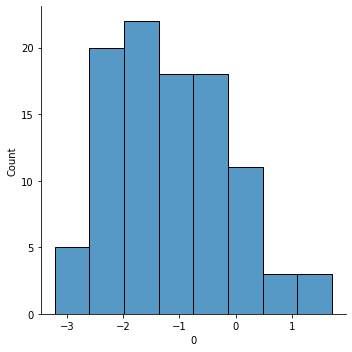

In [11]:
import seaborn as sns
sns.displot(df_subjects, x=0)

#### Creation of moving averages

In [12]:
SPAM_centers = np.arange(-3, 2, 1) # hist des sujets => centres des moving average
#SPAM_centers = [-1]
SPAM_vols = ma.calc_MA_volumes_batch(SPAM_centers, aligned_buckets, df_subjects, axis_n=0, FWHM=1)

Calculating moving averages: 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]


In [26]:
from tqdm import tqdm
SPAM_meshes = {}

for k, volume in tqdm(list(SPAM_vols.items())[:]):
    SPAM_meshes[k]=cld.aims_tools.volume_to_mesh(
                    volume=volume, smoothingFactor=0.3,
                    aimsThreshold="90%")
    
shifted_SPAM_meshes = {}
for dist, mesh in SPAM_meshes.items():
    shifted_SPAM_meshes[str(dist)]=cld.aims_tools.shift_aims_mesh_along_axis(mesh, 2*dist)

100%|██████████| 5/5 [00:14<00:00,  2.85s/it]


#### Visualization of MA

In [27]:
fig = cld.draw(shifted_SPAM_meshes)
ma.plot.brochette_layout(fig, "subjects meshes")

#### Saving of MA

In [28]:
for x, mesh in tqdm(shifted_SPAM_meshes.items()):
    aims.write(mesh, f"MA_{x}_sc.mesh")

100%|██████████| 5/5 [00:00<00:00, 361.97it/s]


### 5) 2 clusters analysis

#### Loading of subjects of the two clusters

In [30]:
tsne_subjects = pd.read_csv('tsne_asym_bench_sc.csv', index_col="id_sub").drop(columns={'Unnamed: 0'})
subjects_tsne = tsne_subjects.index
tsne_subjects = tsne_subjects.rename(columns={'tsne: 0': 0, 'tsne: 1': 1})
tsne_subjects.head()

,0,1,label
id_sub,,,
519950,4.008054,-1.621285,normal_test
103515,2.547560,-5.097945,normal_test
107018,1.798697,2.676100,normal_test
766563,6.575020,1.122650,normal_test
175540,2.784817,-0.695892,normal_test


We can use labels if we have them (in the case where we use benchmark subjects vs controls for example):

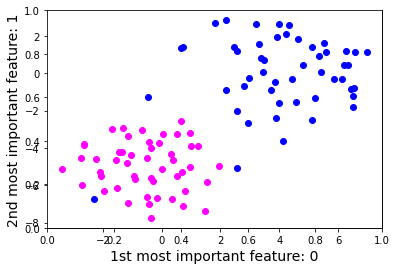

In [31]:
color_dict = {'normal_test': 'blue', 'benchmark': 'magenta'}

arr = np.array([np.array([tsne_subjects[k][i] for k in tsne_subjects.columns[:2]]) for i in tsne_subjects.index])

fig, ax = plt.subplots()
ax = fig.add_subplot(111)
for g in np.unique([tsne_subjects.label]):
    ix = np.where(tsne_subjects.label == g)
    x = [arr[ix][k][0] for k in range(len(ix[0]))]
    y = [arr[ix][k][1] for k in range(len(ix[0]))]
    if g =='benchmark':
        g_lab = 'benchmark asymmetry'
    else:
        g_lab=g
    ax.scatter(x, y, c = color_dict[g], label = g_lab)

plt.xlabel(f'1st most important feature: {tsne_subjects.columns[0]}', fontsize=14)
plt.ylabel(f'2nd most important feature: {tsne_subjects.columns[1]}', fontsize=14)
plt.show()

We can also imagine a case where we don't have any labels but two clusters and apply a kmeans algorithm:

In [32]:
from sklearn.cluster import KMeans

X = np.array([np.array([tsne_subjects[k][i] for k in tsne_subjects.columns[:2]]) for i in tsne_subjects.index])

kmeans = KMeans(n_clusters=2, random_state=0).fit(X)

labels = kmeans.labels_
tsne_subjects['kmeans_label'] = labels
clusters_centroids = kmeans.cluster_centers_
print(f"cluster's centroids coordinates: \n {clusters_centroids}")

cluster's centroids coordinates: 
 [[-0.5277442  -4.92195076]
 [ 4.31508814  0.23949671]]


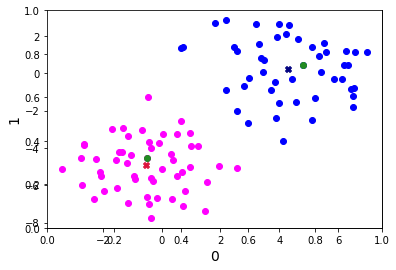

In [33]:
color_dict = {1: 'blue', 0: 'magenta'}

arr = np.array([np.array([tsne_subjects[k][i] for k in tsne_subjects.columns[:2]]) for i in tsne_subjects.index])

fig, ax = plt.subplots()
ax = fig.add_subplot(111)

for g in np.unique(kmeans.labels_):
    ix = np.where(kmeans.labels_ == g)
    x = [arr[ix][k][0] for k in range(len(ix[0]))]
    y = [arr[ix][k][1] for k in range(len(ix[0]))]
    if g =='benchmark':
        g_lab = 'benchmark asymmetry'
    else:
        g_lab=g
    ax.scatter(x, y, c = color_dict[g], label = g_lab)

ax.scatter(clusters_centroids[0][0], clusters_centroids[0][1], color='crimson', marker='X')
ax.scatter(clusters_centroids[1][0], clusters_centroids[1][1], color='navy', marker='X')
ax.scatter(tsne_subjects[0][116726], tsne_subjects[1][116726], color='forestgreen')
ax.scatter(tsne_subjects[0][163836], tsne_subjects[1][163836], color='forestgreen')


plt.xlabel(f'{tsne_subjects.columns[0]}', fontsize=14)
plt.ylabel(f'{tsne_subjects.columns[1]}', fontsize=14)
plt.show()

#### Central subjects for both clusters:

In [34]:
central_1 = closest_distance(clusters_centroids[0], tsne_subjects.drop(['label', 'kmeans_label'], axis=1))
print(f"Closest subject to centroid of cluster 1 is {central_1}")
central_2 = closest_distance(clusters_centroids[1], tsne_subjects.drop(['label', 'kmeans_label'], axis=1))
print(f"Closest subject to centroid of cluster 2 is {central_2}")

Closest subject to centroid of cluster 1 is 116726
Closest subject to centroid of cluster 2 is 163836


We create sub-dataframes based on labels

In [35]:
cluster1 = tsne_subjects[tsne_subjects.kmeans_label==0]
cluster2 = tsne_subjects[tsne_subjects.kmeans_label==1]
assert(len(np.unique(list(cluster1.kmeans_label)))==1)
assert(len(np.unique(list(cluster2.kmeans_label)))==1)

#### Creation of buckets dictionnary

In [36]:
subjects_c1 = cluster1.index
subjects_c2 = cluster2.index

buckets_c1 = {k: v for k,v in buckets.items() if k in list(subjects_c1)}
buckets_c2 = {k: v for k,v in buckets.items() if k in list(subjects_c2)}

#### Alignement of the subjects to respective central subject

In [37]:
aligned_buckets_C1, aligned_rot_C1, aligned_transl_C1 = ma.align_buckets_by_ICP_batch(buckets_c1, central_1, cores=2)
aligned_buckets_C2, aligned_rot_C2, aligned_transl_C2 = ma.align_buckets_by_ICP_batch(buckets_c2, central_2, cores=2)

2


Aligning buckets to 116726: 100%|██████████| 53/53 [01:33<00:00,  1.77s/it]

2



Aligning buckets to 163836: 100%|██████████| 47/47 [01:21<00:00,  1.74s/it]


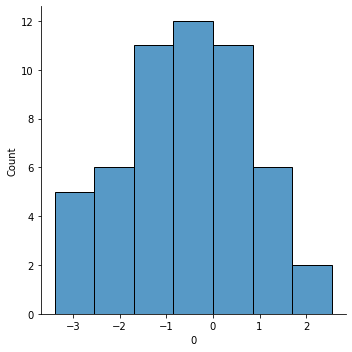

In [38]:
sns.displot(cluster1, x=0)

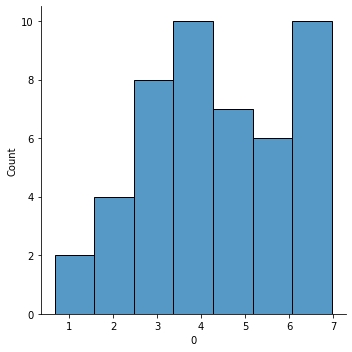

In [39]:
sns.displot(cluster2, x=0)

In [40]:
SPAM_centers_c1 = [0]
SPAM_vols_c1 = ma.calc_MA_volumes_batch(SPAM_centers_c1, aligned_buckets_C1, cluster1, axis_n=0, FWHM=1)

Calculating moving averages: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


In [41]:
SPAM_centers_c2 = [4.5]
SPAM_vols_c2 = ma.calc_MA_volumes_batch(SPAM_centers_c2, aligned_buckets_C2, cluster2, axis_n=0, FWHM=1)

Calculating moving averages: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


In [47]:
SPAM_meshes = {}

for k, volume in tqdm(list(SPAM_vols_c1.items())[:]+list(SPAM_vols_c2.items())[:]):
    SPAM_meshes[k]=cld.aims_tools.volume_to_mesh(
                    volume=volume, smoothingFactor=0.2,
                    aimsThreshold="90%")
    
shifted_SPAM_meshes = {}
for dist, mesh in SPAM_meshes.items():
    shifted_SPAM_meshes[str(dist)]=cld.aims_tools.shift_aims_mesh_along_axis(mesh, dist)

100%|██████████| 2/2 [00:05<00:00,  2.89s/it]


#### Visualization of average crops of both clusters

In [48]:
fig = cld.draw(shifted_SPAM_meshes)
ma.plot.brochette_layout(fig, "subjects meshes")

#### Saving of average crops

In [49]:
for x, mesh in tqdm(shifted_SPAM_meshes.items()):
    aims.write(mesh, f"MA_{x}_2cluster.mesh")

100%|██████████| 2/2 [00:00<00:00, 204.57it/s]
